# E4: Diffusion Models (Coding Part)
---
This is the coding part of E4.

### Dependencies and Utility

In [ ]:
import torch
from torchvision import transforms
from diffusers import StableDiffusionPipeline
import matplotlib.pyplot as plt

import os
from PIL import Image
from tqdm import tqdm
import random
import gc

import matplotlib.pyplot as plt

2025-07-11 10:50:33.222172: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1752231033.244669     270 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1752231033.251547     270 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
def show_images(images, title=None):
    n = len(images)
    fig, axs = plt.subplots(1, n, figsize=(4 * n, 4))

    if n == 1:
        axs = [axs]

    for i, img in enumerate(images):
        axs[i].imshow(img)
        axs[i].axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

## Data Preparation
For TI we need a folder of images that represents our target concept that we want to invert. The following class is provided as a simple dataset over a folder of (unlabelled) images:

In [ ]:
class UnlabeledImageFolderDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, n_images=None, transform=None):
        self.image_dir = image_dir
        self.image_filenames = [f for f in os.listdir(image_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        self.image_filenames = self.image_filenames[:n_images]
        self.transform = transform

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_filenames[idx])
        image = Image.open(img_path).convert("RGB")

        if self.transform:
            image = self.transform(image)
        return image

### Download Images
They will be downloaded and saved under `"content/pokeball"` when executing the next cell.

In [ ]:
!pip install gdown

import gdown
import os
import shutil
import requests

shared_folder_path = 'https://drive.google.com/drive/folders/1vAJYQ7FjhfpAqZA8k2Pzq43ozidhbvQz?usp=sharing'

# Create a local directory to store the downloaded images
local_image_dir = '/content/images/pokeball'
os.makedirs(local_image_dir, exist_ok=True)

# Download the contents of the Google Drive folder using gdown
!gdown --folder "{shared_folder_path}" -O "{local_image_dir}" --no-cookies --no-check-certificate > /dev/null 2>&1

print(f"Downloaded images from '{shared_folder_path}' to '{local_image_dir}'")

Downloaded images from 'https://drive.google.com/drive/folders/1vAJYQ7FjhfpAqZA8k2Pzq43ozidhbvQz?usp=sharing' to '/content/images/pokeball'


### Inspect the Images

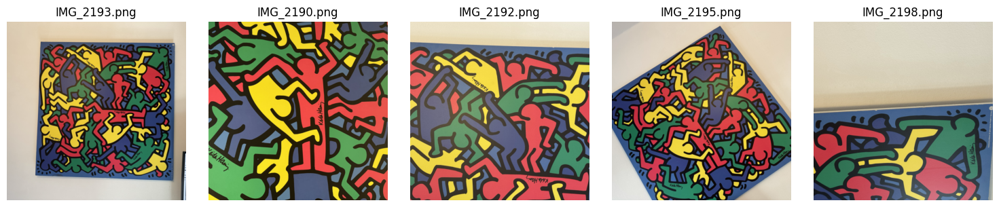

In [ ]:
def show_samples_from_folder(image_dir):
  # Define a basic transform to view images
  transform = transforms.Compose([
      transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
      transforms.CenterCrop(512),
      transforms.ToTensor()
  ])

  # Create the dataset
  dataset = UnlabeledImageFolderDataset(image_dir, transform=transform)

  # Display a few sample images
  num_samples = 5
  fig, axes = plt.subplots(1, num_samples, figsize=(15, 3))

  for i in range(min(num_samples, len(dataset))):
      image = dataset[i]
      axes[i].imshow(image.permute(1, 2, 0)) # Convert from (C, H, W) to (H, W, C) for plotting
      axes[i].set_title(dataset.image_filenames[i])
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()


image_dir = '/kaggle/input/keith-haring/keith_haring'
show_samples_from_folder(image_dir)


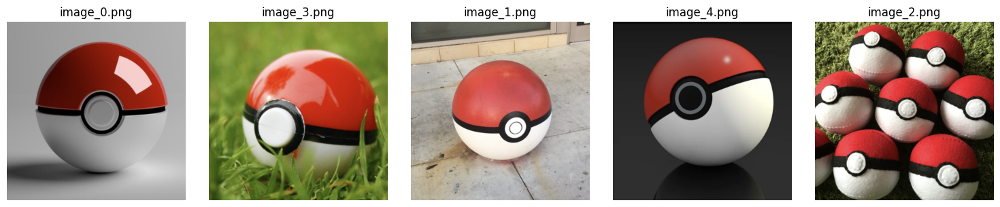

In [ ]:
def show_samples_from_folder(image_dir):
  # Define a basic transform to view images
  transform = transforms.Compose([
      transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
      transforms.CenterCrop(512),
      transforms.ToTensor()
  ])

  # Create the dataset
  dataset = UnlabeledImageFolderDataset(image_dir, transform=transform)

  # Display a few sample images
  num_samples = 5
  fig, axes = plt.subplots(1, num_samples, figsize=(15, 3))

  for i in range(min(num_samples, len(dataset))):
      image = dataset[i]
      axes[i].imshow(image.permute(1, 2, 0)) # Convert from (C, H, W) to (H, W, C) for plotting
      axes[i].set_title(dataset.image_filenames[i])
      axes[i].axis('off')

  plt.tight_layout()
  plt.show()


image_dir = '/content/images/pokeball'
show_samples_from_folder(image_dir)


In [ ]:
# Transformation for TI training
train_transform = transforms.Compose([
    transforms.Resize(512, interpolation=transforms.InterpolationMode.BILINEAR),
    transforms.CenterCrop(512),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5]),  # maps from [0,1] to [-1,1]
])

## 1 - 💻 Loss Function
The TI method relies on the standard DM loss, i.e. the DDPM loss in case of SD v1.4.

The standard DDPM loss is defined as:

$$
L_{\text{DDPM}} = \mathbb{E}_{\mathbf{x}_0, \boldsymbol{\epsilon}, t} \left[ \left\| \boldsymbol{\epsilon} - \boldsymbol{\epsilon}_\theta(\mathbf{x}_t, t) \right\|^2 \right]
$$

Where:
- $\mathbf{x}_0$ is the original image (data sample),
- $\boldsymbol{\epsilon}$ is Gaussian noise,
- $\mathbf{x}_t$ is the noisy version of $\mathbf{x}_0$ at timestep $t$,
- $\boldsymbol{\epsilon}_\theta$ is the noise predicted by the model at timestep $t$.


Complete the standard diffusion model loss function. This function expects a wrapper instance, the original image latents, the index of the current timestep, and the CLIP embeddings. It has to generate noise, add it to the latents, predict the score with the model and compute the final loss based on the target and the prediction. The function returns the loss in the end.

In [ ]:
def compute_standard_diffusion_loss(wrapper, latents, timestep_idx, embeddings):
    """
    Compute the loss for the standard diffusion model.
    """

    # --------------- YOUR CODE STARTS HERE ----------------------------------
    noise = torch.randn_like(latents)

    timestep = wrapper.scheduler.timesteps[timestep_idx].unsqueeze(0).to(wrapper.pipe._execution_device)

    noisy_img = wrapper.scheduler.add_noise(latents, noise, timestep)

    noise_predicted = wrapper.predict_noise(timestep_idx, noisy_img, embeddings)

    loss = torch.nn.functional.mse_loss(noise_predicted, noise, reduction="mean")

    # ---------------- YOUR CODE ENDS HERE -----------------------------------

    return loss

## 2 - 💻 Optimization Setup

### TrainingWrapper

In [ ]:
class TrainingWrapper(torch.nn.Module):

  def __init__(self, pipe):
    super(TrainingWrapper, self).__init__()
    self.pipe = pipe
    self.unet = pipe.unet
    self.vae = pipe.vae
    self.tokenizer = pipe.tokenizer
    self.text_encoder = pipe.text_encoder
    self.scheduler = pipe.scheduler
    self.set_timesteps(1000)

  def encode_prompt(self, prompt):
      return self.pipe.encode_prompt(
          prompt=prompt,
          num_images_per_prompt=1,
          device=self.pipe._execution_device,
          do_classifier_free_guidance=False
      )

  def encode_image_to_latents(self, image):
      latents = self.vae.encode(image.to(next(self.parameters()).dtype).to(self.pipe._execution_device)).latent_dist.sample()
      return latents * self.vae.config.scaling_factor


  def predict_noise(self, timestep_idx, latents, embeds, num_images_per_prompt=1, image_size=512, generator=None):
      height, width = image_size, image_size
      prompt_embeds, negative_prompt_embeds = embeds

      latents = self.scheduler.scale_model_input(latents, self.scheduler.timesteps[timestep_idx])

      batch_size = len(latents)
      num_channels_latents = self.unet.config.in_channels

      latents = self.pipe.prepare_latents(
          batch_size * num_images_per_prompt,
          num_channels_latents,
          height,
          width,
          latents.dtype,
          self.pipe._execution_device,
          generator,
          latents,
      )

      noise_pred = self.unet(
          latents, self.scheduler.timesteps[timestep_idx].unsqueeze(0).to(self.pipe._execution_device),
          encoder_hidden_states=prompt_embeds.to(latents.dtype),
          return_dict=False,
      )[0]

      return noise_pred

  def set_timesteps(self, num_timesteps):
      self.scheduler.set_timesteps(num_timesteps)
      self.pipe._num_timesteps = len(self.scheduler.timesteps)


  def __call__(self, *args, **kwargs):
      return self.pipe(*args, **kwargs).images

### Textual Inversion Setup

In [ ]:
from dataclasses import dataclass, field
from typing import List

@dataclass
class TextualInversionConfig:
    target_folder: str = None
    max_num_target_images: int = None
    prompt_templates: List[str] = field(default_factory=lambda: [
        "{}",
        "{} in a photo",
        "an image of {}",
        "a photo of {}",
        "{} in a scene"
    ])
    num_inversion_steps: int = 1000

    placeholder_tokens: List[str] = field(default_factory=lambda: ["placeholder_1"])
    initializer_token: str = "object"
    learning_rate: float = 1e-2
    show_every: int = 100


In [ ]:
def prepare_for_textual_inversion(wrapper, config):

    # --------------- YOUR CODE STARTS HERE ----------------------------------
    tokenizer = wrapper.tokenizer
    text_encoder = wrapper.text_encoder
    placeholder_tokens = config.placeholder_tokens
    initializer_token = config.initializer_token
    prompt_templates = config.prompt_templates
    lr = config.learning_rate

    # (1) store copy of original embeddings
    wrapper._original_embeddings = text_encoder.get_input_embeddings().weight.data.clone()

    num_added_tokens = tokenizer.add_tokens(placeholder_tokens)
    if num_added_tokens != len(placeholder_tokens):
        raise ValueError(
            f"The tokenizer already contains some of the placeholder tokens.\n"
            f"Please choose different tokens."
        )


    text_encoder.resize_token_embeddings(len(tokenizer))
    embeddings = text_encoder.get_input_embeddings()

    placeholder_token_ids = tokenizer.convert_tokens_to_ids(placeholder_tokens)

    with torch.no_grad():
        initalizer_token_id = tokenizer.convert_tokens_to_ids(initializer_token)
        initalizer_embeddings = embeddings.weight[initalizer_token_id].clone()

        for token_id in placeholder_token_ids:
            embeddings.weight[token_id] = initalizer_embeddings.clone()

    # ❄️❄️❄️ Freeze text encoder except embeddings
    for param  in wrapper.vae.parameters():
        param.requires_grad = False

    for param  in wrapper.unet.parameters():
        param.requires_grad = False

    for param in text_encoder.parameters():
        param.requires_grad = False

    embeddings = text_encoder.get_input_embeddings()
    embeddings.weight.requires_grad = True

    wrapper.placeholder_token_ids = placeholder_token_ids


    optimizer = torch.optim.AdamW([embeddings.weight], lr=lr)

    og_step = optimizer.step

    def patched_step(closure=None):
        og_step(closure)

        # set not placeholder tokens to _original_embeddings
        with torch.no_grad():
            current_step_embeddings = wrapper.text_encoder.get_input_embeddings()
            for i in range(len(current_step_embeddings.weight)):
                if i not in wrapper.placeholder_token_ids:
                    if i < len(wrapper._original_embeddings): #unsure ?
                        current_step_embeddings.weight[i] = wrapper._original_embeddings[i]


    optimizer.step = patched_step

    # ----------------- YOUR CODE ENDS HERE ------------------------------------

    return optimizer


## 3 - Main Algorithm

In [ ]:
# Create a wrapped SD pipeline
wrapper = TrainingWrapper(
    StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4").to("cuda")
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

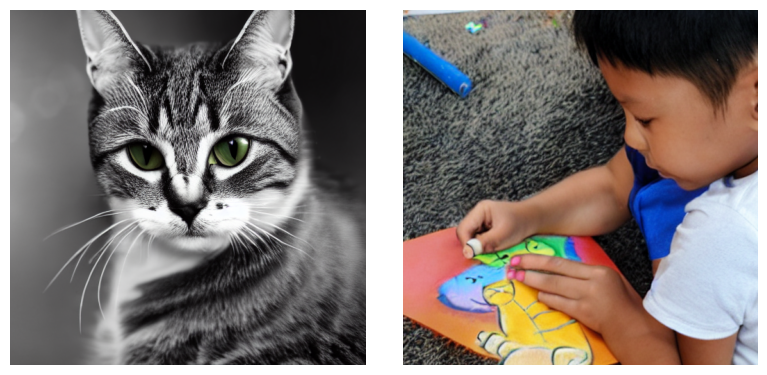

In [ ]:
# Inference
prompt_1 = "A photo of a cat"
prompt_2 = "A kid drawing a beautiful cat"

images = wrapper([prompt_1, prompt_2])
show_images(images)

In [ ]:
# Helper function to use for sampling during textual inversion
def validation_sampling(wrapper, config, step):
    wrapper.eval()
    with torch.no_grad():
        prompt = ' '.join(config.placeholder_tokens)
        images = wrapper([prompt], generator=torch.Generator().manual_seed(0))
        show_images(images, title=f"Step {step}")
    wrapper.train()

### 💻 Implementation

In [ ]:
def textual_inversion_old(wrapper, config):

    # --------------- YOUR CODE STARTS HERE ----------------------------------
    optimizer = prepare_for_textual_inversion(wrapper, config)

    device = wrapper.pipe._execution_device

    wrapper.to(device)

    training_img  = UnlabeledImageFolderDataset(config.target_folder, transform=train_transform)

    num_img = len(training_img)
    assert num_img > 0, f"Number of training images is zero! Len: {len(trainng_img)}"

    for step in range(config.num_inversion_steps):
        idx = torch.randint(low=0, high=num_img, size=(1,)).item()
        image = training_img[idx].to(device)
        image = image.unsqueeze(0)

        latents = wrapper.encode_image_to_latents(image).detach()

        timestep_idx = torch.randint(low=0, high=len(wrapper.scheduler.timesteps), size=()).item()

        template = config.prompt_templates[step % len(config.prompt_templates)]
        prompt = template.format(config.placeholder_tokens[0])


        prompt_embeddings = wrapper.encode_prompt(prompt)

        token_id = wrapper.tokenizer.convert_tokens_to_ids(config.placeholder_tokens[0])#

        tokenized = wrapper.tokenizer(prompt, return_tensors="pt")#
        input_ids = tokenized["input_ids"].to(device)#
        # Find position of the placeholder token
        placeholder_pos = (input_ids == token_id).nonzero(as_tuple=False)
        if len(placeholder_pos) == 0:
            raise ValueError(f"Placeholder token '{config.placeholder_tokens[0]}' not found in: {prompt}")

        pos = placeholder_pos[0][1].item()  # column index in prompt

        # Get trainable embedding from text encoder (with grad)
        embedding_layer = wrapper.text_encoder.get_input_embeddings()
        trainable_embedding = embedding_layer(input_ids)[0, pos, :]
        prompt_embeddings[0][0, pos, :] = trainable_embedding

        embeddings = prompt_embeddings

        optimizer.zero_grad()
        loss = compute_standard_diffusion_loss(wrapper, latents, timestep_idx, embeddings)
        loss.backward()
        optimizer.step()

        if (step + 1) % config.show_every == 0 or step == 0:
            print(f"Step {step+1} / {config.num_inversion_steps} with loss: {loss.item():.2f}")


    print(f"Done with textual inveersion training :D")

    # --------------- YOUR CODE ENDS HERE ---------------------------------


In [ ]:
def textual_inversion(wrapper, config):

    # --------------- YOUR CODE STARTS HERE ----------------------------------
    optimizer = prepare_for_textual_inversion(wrapper, config)
    wrapper.vae.eval()
    wrapper.unet.eval()
    wrapper.text_encoder.train()

    dataset = UnlabeledImageFolderDataset(config.target_folder, config.max_num_target_images, train_transform)
    dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)

    prompt_templates = []
    for template in config.prompt_templates:
        for placeholder in config.placeholder_tokens:
            prompt_templates.append(template.format(placeholder))

    for step in range(config.num_inversion_steps):
        try:
            image = next(iter(dataloader))
        except:
            dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, shuffle=True)
            image = next(iter(dataloader))

        with torch.no_grad():
            latents = wrapper.encode_image_to_latents(image.to(wrapper.pipe._execution_device))

        prompt_idx = torch.randint(0, len(prompt_templates), (1,)).item()
        prompt = prompt_templates[prompt_idx]

        current_prompt_embedding = wrapper.encode_prompt(prompt)

        timestep_idx = torch.randint(0, len(wrapper.scheduler.timesteps), (1,)).item()

        optimizer.zero_grad()
        loss = compute_standard_diffusion_loss(wrapper, latents, timestep_idx, current_prompt_embedding)
        loss.backward()
        optimizer.step()

        if step % config.show_every == 0:
            print(f"Step: {step}/{config.num_inversion_steps}, Loss: {loss.item():.4f}")

            validation_sampling(wrapper, config, step)

    print("Textual inversion fine tuning done!")
    # --------------- YOUR CODE ENDS HERE ---------------------------------


In [ ]:
config = TextualInversionConfig(target_folder="/content/images/pokeball")

The new embeddings will be initialized from a multivariate normal distribution that has old embeddings' mean and covariance. As described in this article: https://nlp.stanford.edu/~johnhew/vocab-expansion.html. To disable this, use `mean_resizing=False`


Step: 0/1000, Loss: 0.1353


  0%|          | 0/50 [00:00<?, ?it/s]

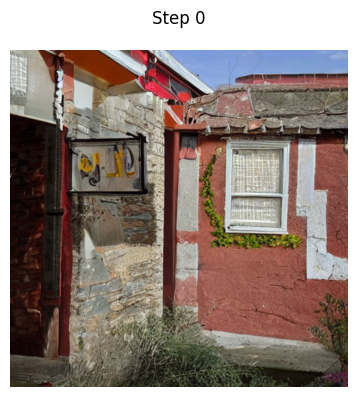

Step: 100/1000, Loss: 0.0210


  0%|          | 0/50 [00:00<?, ?it/s]

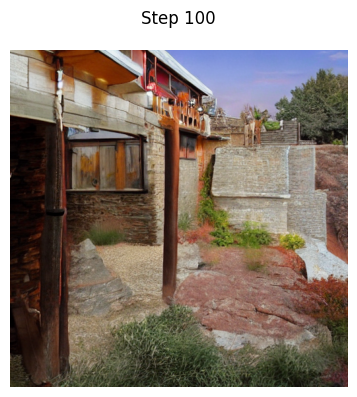

Step: 200/1000, Loss: 0.0213


  0%|          | 0/50 [00:00<?, ?it/s]

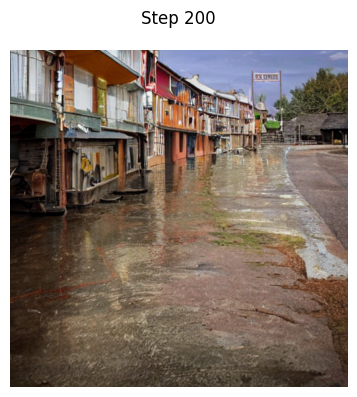

Step: 300/1000, Loss: 0.0064


  0%|          | 0/50 [00:00<?, ?it/s]

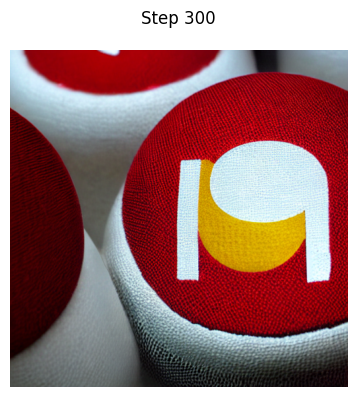

Step: 400/1000, Loss: 0.0218


  0%|          | 0/50 [00:00<?, ?it/s]

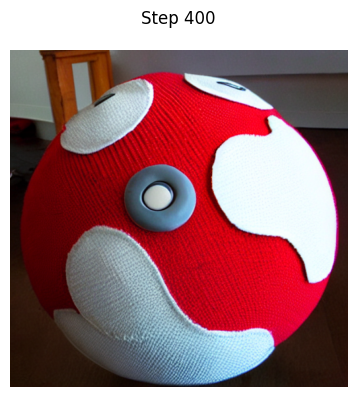

Step: 500/1000, Loss: 0.0665


  0%|          | 0/50 [00:00<?, ?it/s]

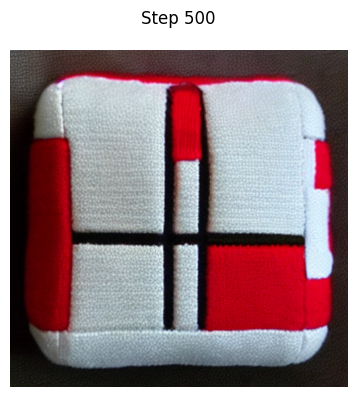

Step: 600/1000, Loss: 0.0071


  0%|          | 0/50 [00:00<?, ?it/s]

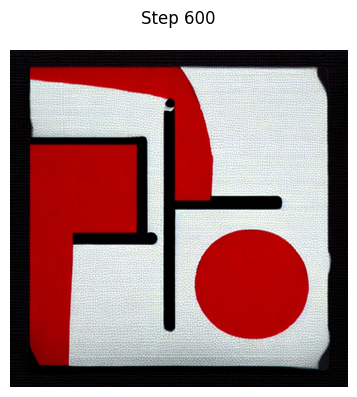

Step: 700/1000, Loss: 0.0058


  0%|          | 0/50 [00:00<?, ?it/s]

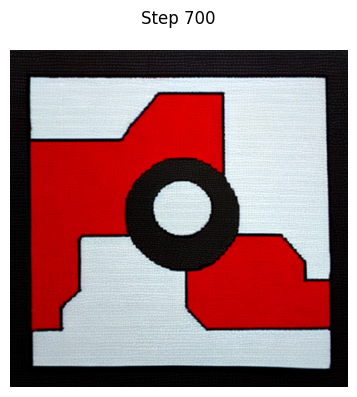

Step: 800/1000, Loss: 0.0159


  0%|          | 0/50 [00:00<?, ?it/s]

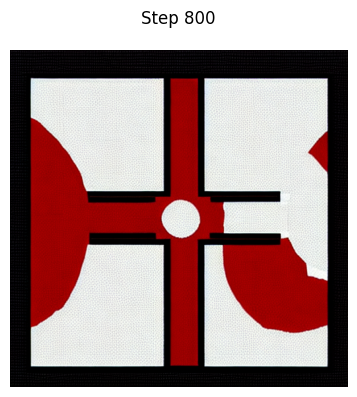

Step: 900/1000, Loss: 0.0273


  0%|          | 0/50 [00:00<?, ?it/s]

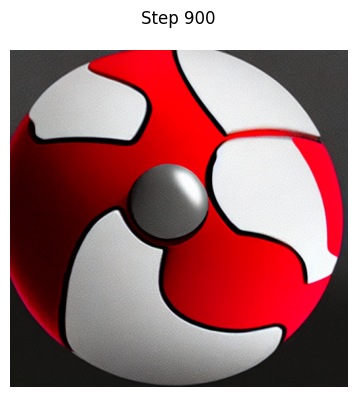

Textual inversion fine tuning done!


In [ ]:
textual_inversion(wrapper, config)

### 💻 Evaluation

  0%|          | 0/50 [00:00<?, ?it/s]

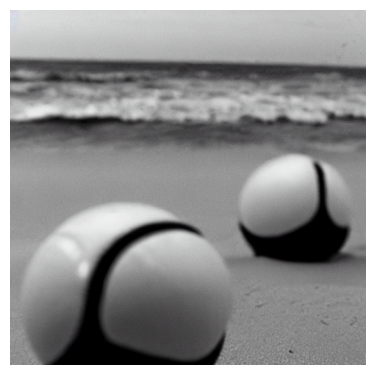

In [ ]:
images = wrapper(["black and white photo of placeholder_1 at the beach"], generator=torch.Generator().manual_seed(42))
show_images(images)

In [ ]:
#del wrapper
#gc.collect()
#torch.cuda.empty_cache()

In [ ]:
# --------------- YOUR CODE STARTS HERE ---------------------------------
import kagglehub

# Download latest version
path = kagglehub.dataset_download("georg33m/keith-haring")

print("Path to dataset files:", path)
# You are free to create additional cells for your experiments below

Path to dataset files: /kaggle/input/keith-haring


  0%|          | 0/50 [00:00<?, ?it/s]

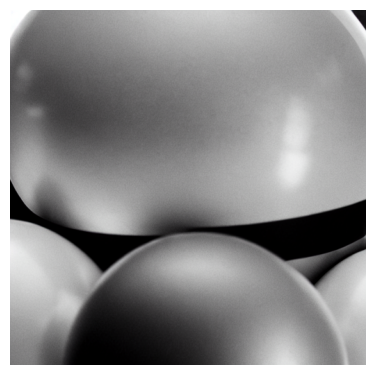

  0%|          | 0/50 [00:00<?, ?it/s]

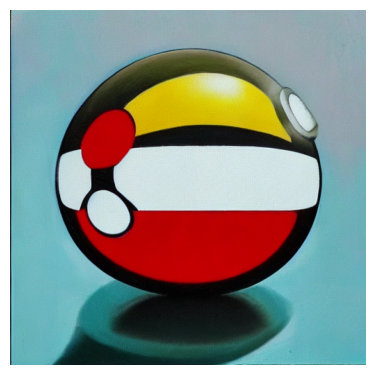

  0%|          | 0/50 [00:00<?, ?it/s]

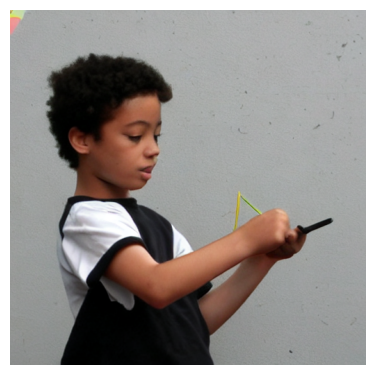

  0%|          | 0/50 [00:00<?, ?it/s]

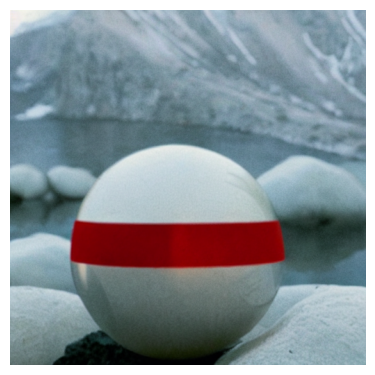

  0%|          | 0/50 [00:00<?, ?it/s]

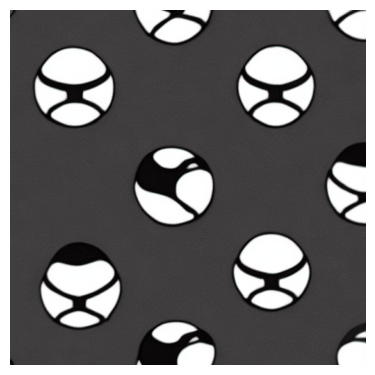

  0%|          | 0/50 [00:00<?, ?it/s]

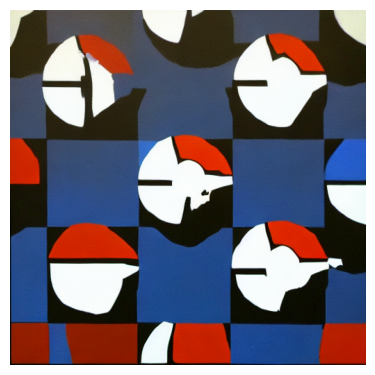

  0%|          | 0/50 [00:00<?, ?it/s]

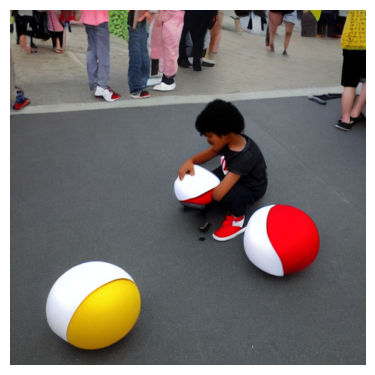

  0%|          | 0/50 [00:00<?, ?it/s]

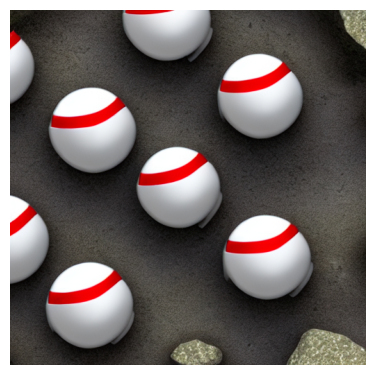

  0%|          | 0/50 [00:00<?, ?it/s]

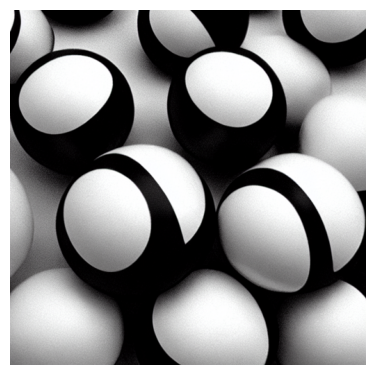

  0%|          | 0/50 [00:00<?, ?it/s]

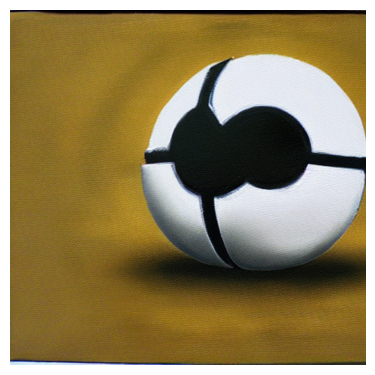

  0%|          | 0/50 [00:00<?, ?it/s]

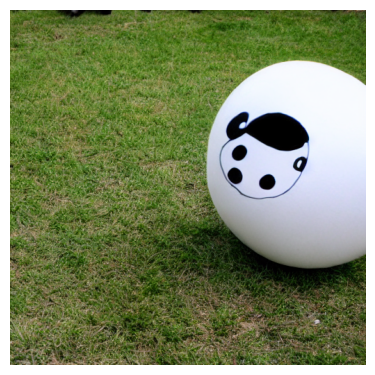

  0%|          | 0/50 [00:00<?, ?it/s]

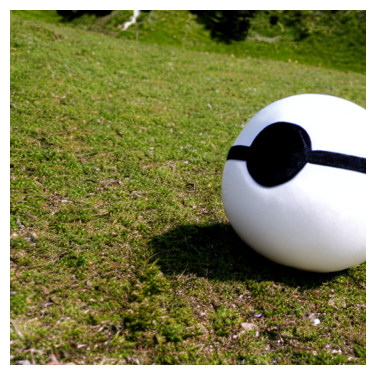

  0%|          | 0/50 [00:00<?, ?it/s]

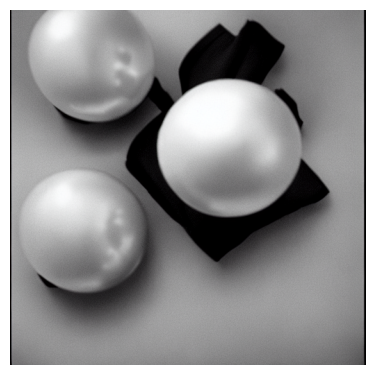

  0%|          | 0/50 [00:00<?, ?it/s]

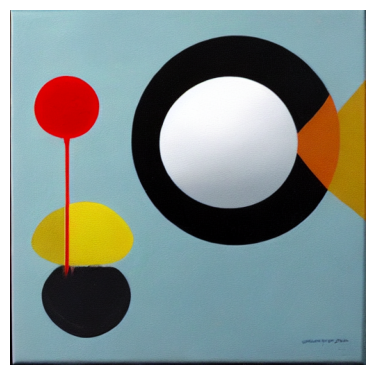

  0%|          | 0/50 [00:00<?, ?it/s]

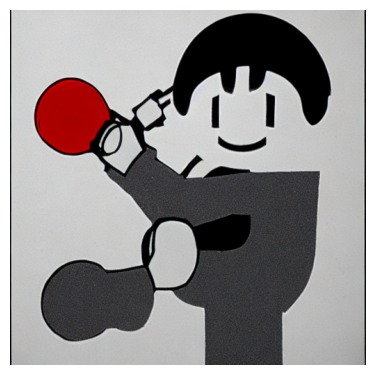

  0%|          | 0/50 [00:00<?, ?it/s]

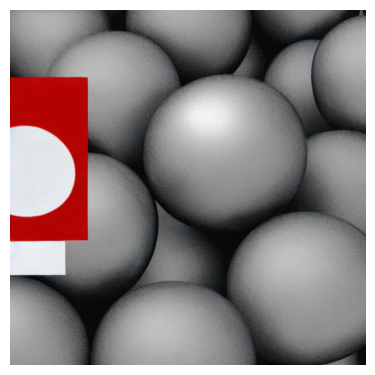

In [ ]:
#3 b) i.
for i in range(4):
    images = wrapper(["black and white photo of placeholder_1"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)
    images = wrapper(["oil paining of placeholder_1"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)
    images = wrapper(["a kid drawing placeholder_1"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)
    images = wrapper(["a photo of placeholder_1 at the top of a mountain"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)

Step: 0/1000, Loss: 0.0294


  0%|          | 0/50 [00:00<?, ?it/s]

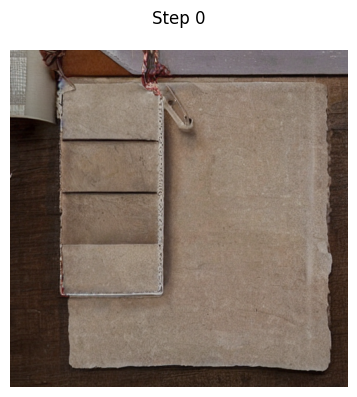

Step: 100/1000, Loss: 0.0922


  0%|          | 0/50 [00:00<?, ?it/s]

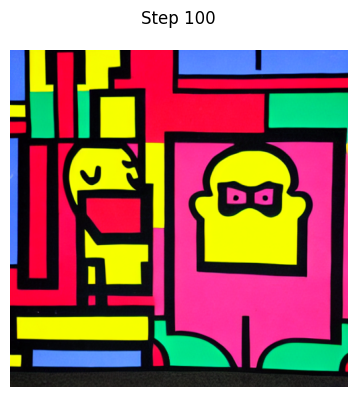

Step: 200/1000, Loss: 0.2206


  0%|          | 0/50 [00:00<?, ?it/s]

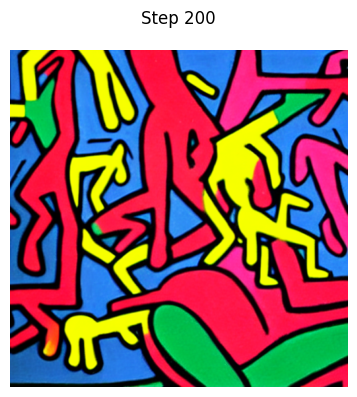

Step: 300/1000, Loss: 0.1071


  0%|          | 0/50 [00:00<?, ?it/s]

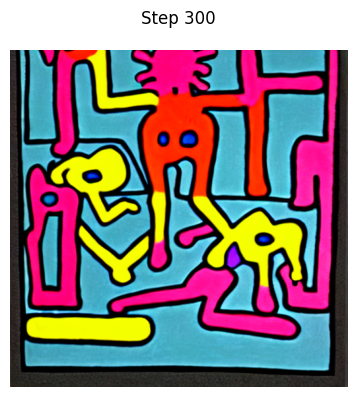

Step: 400/1000, Loss: 0.1655


  0%|          | 0/50 [00:00<?, ?it/s]

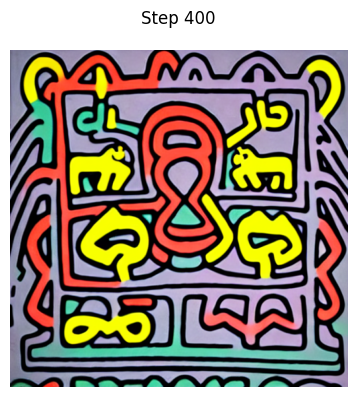

Step: 500/1000, Loss: 0.0932


  0%|          | 0/50 [00:00<?, ?it/s]

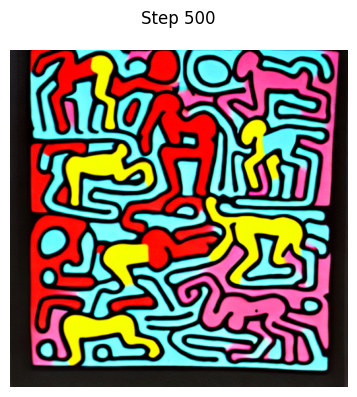

Step: 600/1000, Loss: 0.0461


  0%|          | 0/50 [00:00<?, ?it/s]

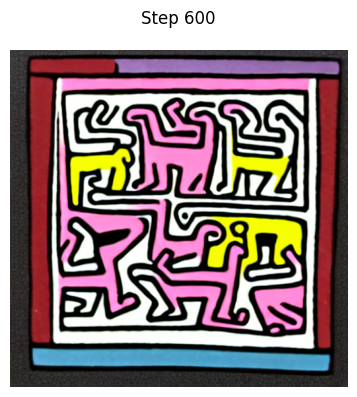

Step: 700/1000, Loss: 0.0199


  0%|          | 0/50 [00:00<?, ?it/s]

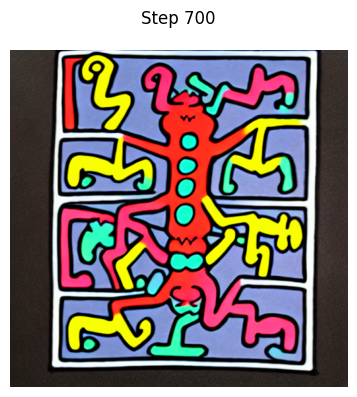

Step: 800/1000, Loss: 0.0647


  0%|          | 0/50 [00:00<?, ?it/s]

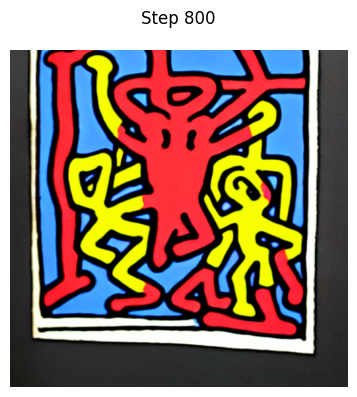

Step: 900/1000, Loss: 0.0679


  0%|          | 0/50 [00:00<?, ?it/s]

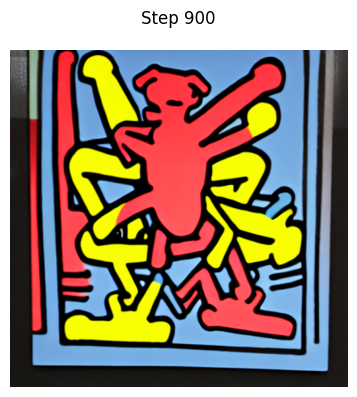

Textual inversion fine tuning done!


  0%|          | 0/50 [00:00<?, ?it/s]

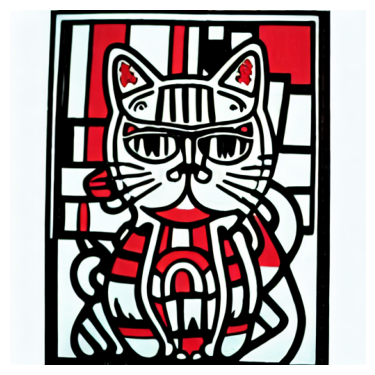

In [ ]:
own_config = TextualInversionConfig(target_folder="/kaggle/input/keith-haring/keith_haring", placeholder_tokens=["placeholder_2"], initializer_token="style")
textual_inversion(wrapper, own_config)
images = wrapper(["photo of a cat in style of placeholder_2"], generator=torch.Generator().manual_seed(42))
show_images(images)

  0%|          | 0/50 [00:00<?, ?it/s]

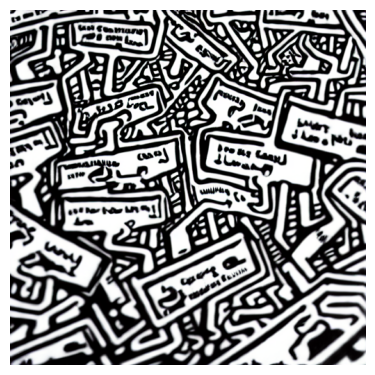

  0%|          | 0/50 [00:00<?, ?it/s]

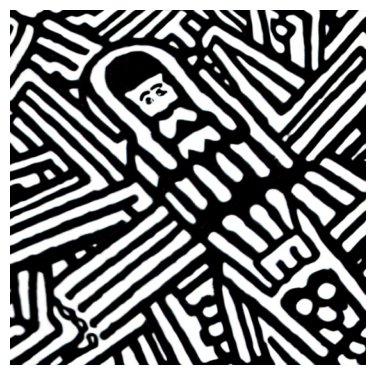

  0%|          | 0/50 [00:00<?, ?it/s]

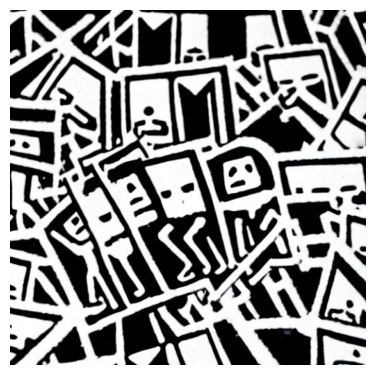

  0%|          | 0/50 [00:00<?, ?it/s]

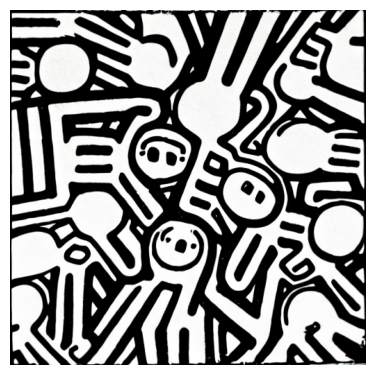

  0%|          | 0/50 [00:00<?, ?it/s]

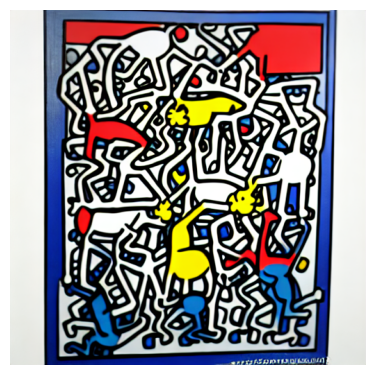

  0%|          | 0/50 [00:00<?, ?it/s]

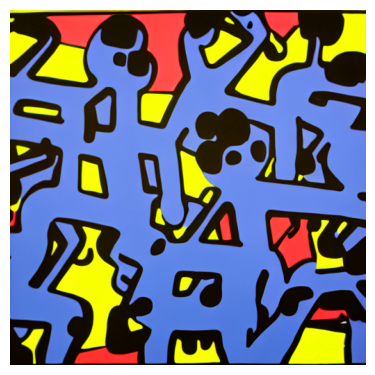

  0%|          | 0/50 [00:00<?, ?it/s]

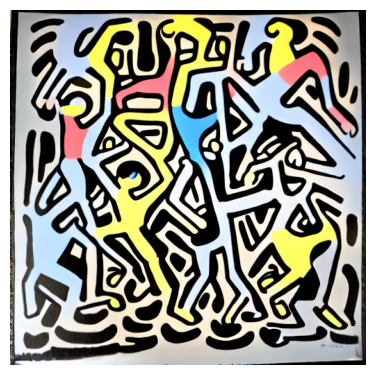

  0%|          | 0/50 [00:00<?, ?it/s]

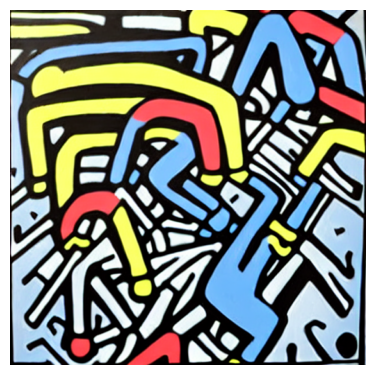

  0%|          | 0/50 [00:00<?, ?it/s]

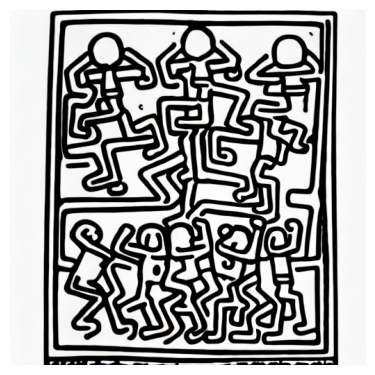

  0%|          | 0/50 [00:00<?, ?it/s]

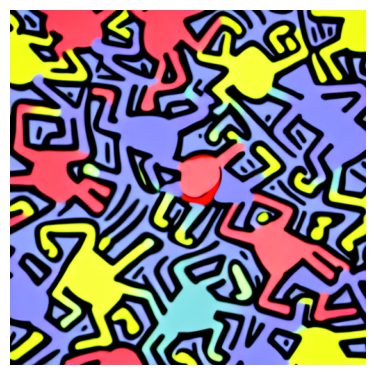

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


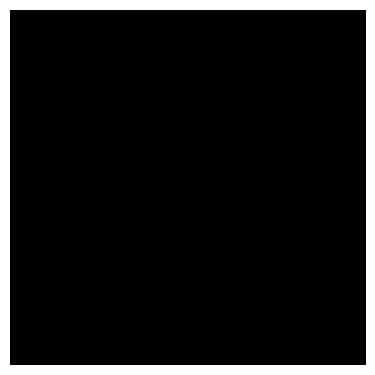

  0%|          | 0/50 [00:00<?, ?it/s]

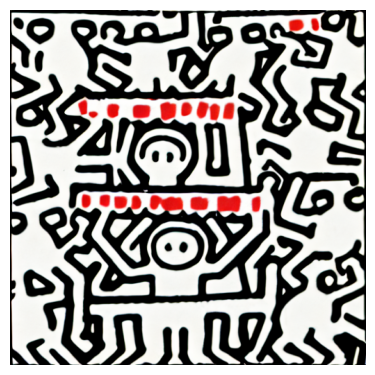

  0%|          | 0/50 [00:00<?, ?it/s]

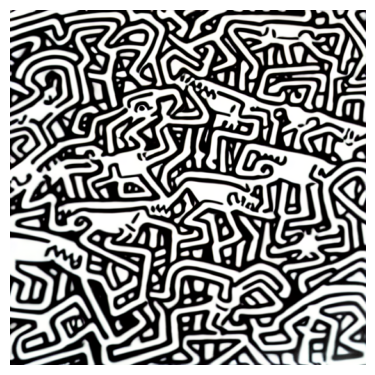

  0%|          | 0/50 [00:00<?, ?it/s]

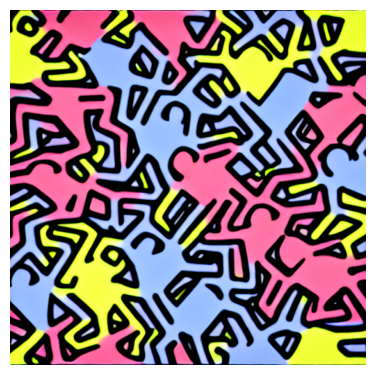

  0%|          | 0/50 [00:00<?, ?it/s]

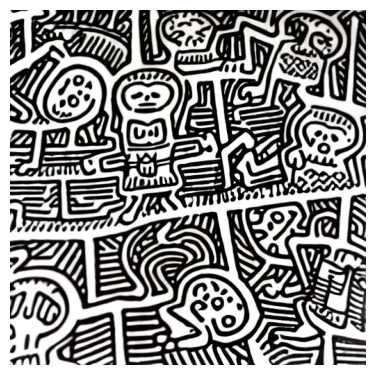

  0%|          | 0/50 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


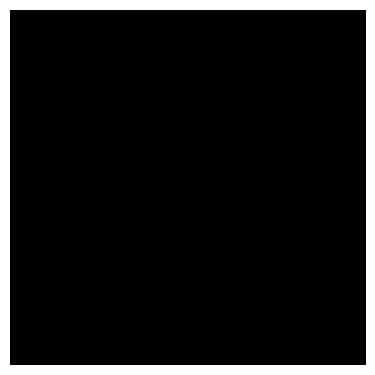

In [ ]:
# 3 b) ii.
for i in range(4):
    images = wrapper(["black and white photo of placeholder_2"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)
for i in range(4):
    images = wrapper(["oil paining of placeholder_2"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)
for i in range(4):
    images = wrapper(["a kid drawing placeholder_2"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)
for i in range(4):
    images = wrapper(["a photo of placeholder_2 at the top of a mountain"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)

a photo of placeholder_1 in the style of placeholder_2


  0%|          | 0/50 [00:00<?, ?it/s]

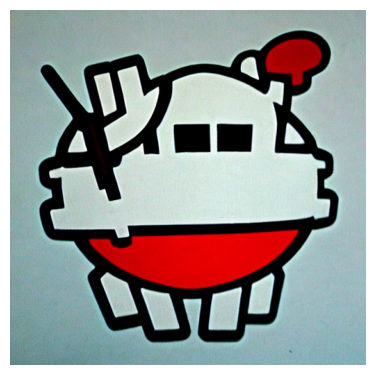

  0%|          | 0/50 [00:00<?, ?it/s]

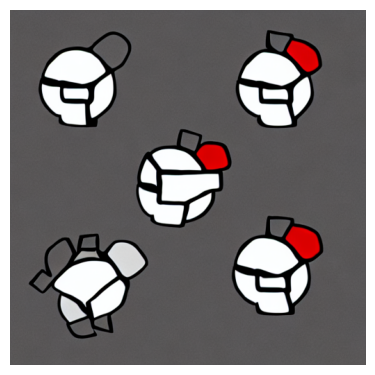

  0%|          | 0/50 [00:00<?, ?it/s]

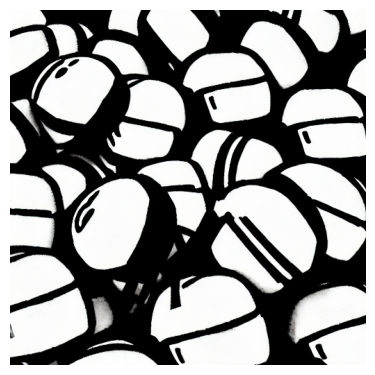

  0%|          | 0/50 [00:00<?, ?it/s]

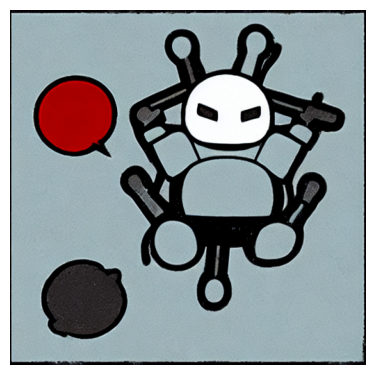

placeholder_1 and placeholder_2 at the beach


  0%|          | 0/50 [00:00<?, ?it/s]

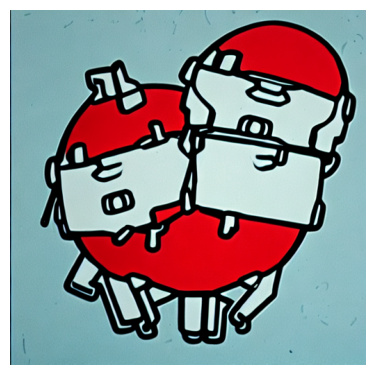

  0%|          | 0/50 [00:00<?, ?it/s]

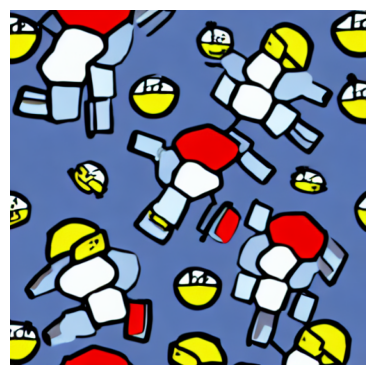

  0%|          | 0/50 [00:00<?, ?it/s]

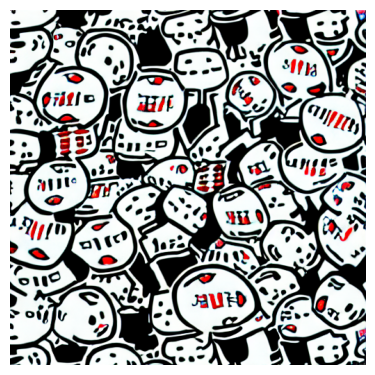

  0%|          | 0/50 [00:00<?, ?it/s]

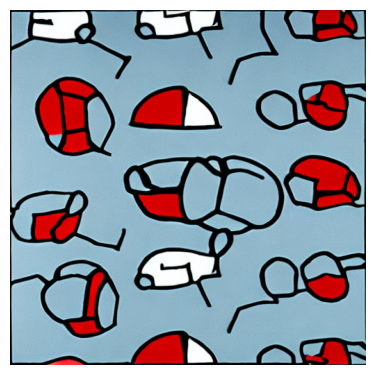

In [ ]:
# 3 b) iii.
print("a photo of placeholder_1 in the style of placeholder_2")
for i in range(0,4):
    images = wrapper(["a photo of placeholder_1 in the style of placeholder_2"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)

print("placeholder_1 and placeholder_2 at the beach")
for i in range(0,4):
    images = wrapper(["placeholder_1 and placeholder_2 at the beach"], generator=torch.Generator().manual_seed(42+i))
    show_images(images)